In [272]:
# import the packages
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = 10, 7.5
plt.rcParams['axes.grid'] = True

import pandas_profiling   #need to install using anaconda prompt (pip install pandas_profiling)
import scipy.stats as stats

from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import f_regression
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.model_selection import GridSearchCV
from sklearn import ensemble,linear_model,neighbors,metrics,tree

from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels as st
import statsmodels.formula.api as smp

from patsy import dmatrices
import itertools
import xgboost
import pickle

pd.set_option('display.max_rows',500)
pd.set_option('display.max_columns',500)

In [273]:
# ---------------------------------------------------------------------------
# ModuleNotFoundError                       Traceback (most recent call last)
# <ipython-input-196-f2320922b3e2> in <module>
#      25 
#      26 from sklearn.feature_selection import f_regression
# ---> 27 import xgboost

# ModuleNotFoundError: No module named 'xgboost'

In [274]:
#!pip install xgboost

In [275]:
# ---------------------------------------------------------------------------
# ModuleNotFoundError                       Traceback (most recent call last)
# <ipython-input-2-1f303ecce5f6> in <module>
#       5 
#       6 #!pip install pandas_profiling
# ----> 7 import pandas_profiling
#       8 import scipy.stats as stats
#       9 import sklearn as sk

# ModuleNotFoundError: No module named 'pandas_profiling'

In [276]:
#!pip install pandas_profiling

# Load the Data set...

In [277]:
custdata = pd.read_excel("Data Set.xlsx")
custdata.head()

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,union,employ,empcat,retire,income,lninc,inccat,debtinc,creddebt,lncreddebt,othdebt,lnothdebt,default,jobsat,marital,spoused,spousedcat,reside,pets,pets_cats,pets_dogs,pets_birds,pets_reptiles,pets_small,pets_saltfish,pets_freshfish,homeown,hometype,address,addresscat,cars,carown,cartype,carvalue,carcatvalue,carbought,carbuy,commute,commutecat,commutetime,commutecar,commutemotorcycle,commutecarpool,commutebus,commuterail,commutepublic,commutebike,commutewalk,commutenonmotor,telecommute,reason,polview,polparty,polcontrib,vote,card,cardtype,cardbenefit,cardfee,cardtenure,cardtenurecat,card2,card2type,card2benefit,card2fee,card2tenure,card2tenurecat,cardspent,card2spent,active,bfast,tenure,churn,longmon,lnlongmon,longten,lnlongten,tollfree,tollmon,lntollmon,tollten,lntollten,equip,equipmon,lnequipmon,equipten,lnequipten,callcard,cardmon,lncardmon,cardten,lncardten,wireless,wiremon,lnwiremon,wireten,lnwireten,multline,voice,pager,internet,callid,callwait,forward,confer,ebill,owntv,hourstv,ownvcr,owndvd,owncd,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03
0,3964-QJWTRG-NPN,1,2.0,1,20,2,September,15,3,1,1,0,1,0,31,3.433987,2,11.1,1.200909,0.183079,2.240091,0.806516,1,1,0,-1,-1,3,0,0,0,0,0,0,0,0,0,2,0,1,2,1,0,14.3,1,0,0,8,4,22.0,0,1,1,0,0,0,0,1,0,0,9,6,1,0,1,3,1,1,0,2,2,5,3,1,0,3,2,81.66,67.80,0,3,5,1,6.50,1.871802,34.40,3.538057,1,29.0,3.367296,161.05,5.081715,1,29.50,3.384390,126.1,4.837075,1,14.25,2.656757,60.0,4.094345,0,0.00,NaN,0.00,NaN,1,1,1,0,0,1,1,1,0,1,13,1,1,0,0,0,1,1,0,0,0,1,0
1,0648-AIPJSP-UVM,5,5.0,0,22,2,May,17,4,2,0,0,1,0,15,2.708050,1,18.6,1.222020,0.200505,1.567980,0.449788,1,1,0,-1,-1,2,6,0,0,0,0,0,0,6,1,3,2,1,2,1,1,6.8,1,0,0,1,1,29.0,1,0,0,1,0,0,1,0,1,1,9,4,1,0,0,2,4,1,0,4,2,4,1,3,0,4,2,42.60,34.94,1,1,39,0,8.90,2.186051,330.60,5.800909,0,0.0,NaN,0.00,NaN,1,54.85,4.004602,1975.0,7.588324,1,16.00,2.772589,610.0,6.413459,1,45.65,3.821004,1683.55,7.428660,1,1,1,4,1,0,1,0,1,1,18,1,1,1,1,1,1,1,1,1,0,0,0
2,5195-TLUDJE-HVO,3,4.0,1,67,6,June,14,2,2,0,16,5,0,35,3.555348,2,9.9,0.928620,-0.074056,2.536380,0.930738,0,4,1,13,2,3,3,2,1,0,0,0,0,0,1,1,30,5,3,1,1,18.8,1,0,1,4,3,24.0,1,0,1,1,1,0,0,0,0,0,2,5,1,0,0,2,1,4,0,35,5,4,1,3,0,25,5,184.22,175.75,0,3,65,0,28.40,3.346389,1858.35,7.527444,0,0.0,NaN,0.00,NaN,0,0.00,NaN,0.0,NaN,1,23.00,3.135494,1410.0,7.251345,0,0.00,NaN,0.00,NaN,1,0,0,0,0,0,0,0,0,1,21,1,1,1,0,0,0,0,0,1,0,0,0
3,4459-VLPQUH-3OL,4,3.0,0,23,2,May,16,3,2,0,0,1,0,20,2.995732,1,5.7,0.022800,-3.780995,1.117200,0.110826,1,2,1,18,4,5,0,0,0,0,0,0,0,0,1,3,3,2,3,1,1,8.7,1,0,1,1,1,38.0,1,0,0,0,0,0,0,0,0,0,9,3,0,0,0,2,1,4,0,5,2,3,2,4,0,5,2,340.99,18.42,1,1,36,0,6.00,1.791759,199.45,5.295564,0,0.0,NaN,0.00,NaN,0,0.00,NaN,0.0,NaN,1,21.00,3.044522,685.0,6.529419,0,0.00,NaN,0.00,NaN,1,0,0,2,0,0,0,0,1,1,26,1,1,1,0,1,1,1,0,1,1,0,0
4,8158-SMTQFB-CNO,2,2.0,0,26,3,July,16,3,2,0,1,1,0,23,3.135494,1,1.7,0.214659,-1.538705,0.176341,-1.735336,0,1,1,13,2,4,0,0,0,0,0,0,0,0,0,2,3,2,1,0,1,10.6,1,0,1,6,3,32.0,0,0,0,0,0,1,0,1,0,0,9,4,0,0,0,4,2,1,0,8,3,1,3,2,0,9,3,255.10,252.73,1,3,21,0,3.05,1.115142,74.10,4.305416,1,16.5,2.803360,387.70,5.960232,0,0.00,NaN,0.0,NaN,1,17.25,2.847812,360.0,5.886104,1,19.05,2.947067,410.80,6.018106,0,1,0,3,1,1,1,1,0,1,27,1,1,1,0,1,0,1,0,0,0,1,0


In [278]:
# Find column information in the dataframe.
custdata.columns

Index(['custid', 'region', 'townsize', 'gender', 'age', 'agecat', 'birthmonth',
       'ed', 'edcat', 'jobcat',
       ...
       'owncd', 'ownpda', 'ownpc', 'ownipod', 'owngame', 'ownfax', 'news',
       'response_01', 'response_02', 'response_03'],
      dtype='object', length=130)

In [279]:
custdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Columns: 130 entries, custid to response_03
dtypes: float64(31), int64(97), object(2)
memory usage: 5.0+ MB


# create UDFs

In [280]:
# Create Data audit Report for continuous variables
def continuous_var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  
                      x.std(), x.var(), x.min(), x.quantile(0.01), x.quantile(0.05),
                          x.quantile(0.10),x.quantile(0.25),x.quantile(0.50),x.quantile(0.75), 
                              x.quantile(0.90),x.quantile(0.95), x.quantile(0.99),x.max()], 
                  index = ['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'MIN', 'P1', 
                               'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])

In [281]:
# Create Data audit Report for categorical variables
def categorical_var_summary(x):
    Mode = x.value_counts().sort_values(ascending = False)[0:1].reset_index()
    return pd.Series([x.count(), x.isnull().sum(), Mode.iloc[0, 0], Mode.iloc[0, 1], 
                          round(Mode.iloc[0, 1] * 100/x.count(), 2)], 
                  index = ['N', 'NMISS', 'MODE', 'FREQ', 'PERCENT'])

In [282]:
# Missing value imputation for categorical and continuous variables
def missing_imputation(x, stats = 'mean'):
    if (x.dtypes == 'float64') | (x.dtypes == 'int64'):
        x = x.fillna(x.mean()) if stats == 'mean' else x.fillna(x.median())
    else:
        x = x.fillna(x.mode())
    return x

In [283]:
# An utility function to create dummy variable
def create_dummies(df, colname):
    col_dummies = pd.get_dummies(df[colname], prefix = colname, drop_first = True)
    df = pd.concat([df, col_dummies], axis = 1)
    df.drop(colname, axis = 1, inplace = True )
    return df

# Creating Y variable...

In [284]:
#To create Y we need to sumup cardspent(first card spent amount) and card2spent(Second card spent amount)
custdata['totalspend'] = custdata['cardspent'] + custdata['card2spent']

custdata.head()

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,union,employ,empcat,retire,income,lninc,inccat,debtinc,creddebt,lncreddebt,othdebt,lnothdebt,default,jobsat,marital,spoused,spousedcat,reside,pets,pets_cats,pets_dogs,pets_birds,pets_reptiles,pets_small,pets_saltfish,pets_freshfish,homeown,hometype,address,addresscat,cars,carown,cartype,carvalue,carcatvalue,carbought,carbuy,commute,commutecat,commutetime,commutecar,commutemotorcycle,commutecarpool,commutebus,commuterail,commutepublic,commutebike,commutewalk,commutenonmotor,telecommute,reason,polview,polparty,polcontrib,vote,card,cardtype,cardbenefit,cardfee,cardtenure,cardtenurecat,card2,card2type,card2benefit,card2fee,card2tenure,card2tenurecat,cardspent,card2spent,active,bfast,tenure,churn,longmon,lnlongmon,longten,lnlongten,tollfree,tollmon,lntollmon,tollten,lntollten,equip,equipmon,lnequipmon,equipten,lnequipten,callcard,cardmon,lncardmon,cardten,lncardten,wireless,wiremon,lnwiremon,wireten,lnwireten,multline,voice,pager,internet,callid,callwait,forward,confer,ebill,owntv,hourstv,ownvcr,owndvd,owncd,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,totalspend
0,3964-QJWTRG-NPN,1,2.0,1,20,2,September,15,3,1,1,0,1,0,31,3.433987,2,11.1,1.200909,0.183079,2.240091,0.806516,1,1,0,-1,-1,3,0,0,0,0,0,0,0,0,0,2,0,1,2,1,0,14.3,1,0,0,8,4,22.0,0,1,1,0,0,0,0,1,0,0,9,6,1,0,1,3,1,1,0,2,2,5,3,1,0,3,2,81.66,67.80,0,3,5,1,6.50,1.871802,34.40,3.538057,1,29.0,3.367296,161.05,5.081715,1,29.50,3.384390,126.1,4.837075,1,14.25,2.656757,60.0,4.094345,0,0.00,NaN,0.00,NaN,1,1,1,0,0,1,1,1,0,1,13,1,1,0,0,0,1,1,0,0,0,1,0,149.46
1,0648-AIPJSP-UVM,5,5.0,0,22,2,May,17,4,2,0,0,1,0,15,2.708050,1,18.6,1.222020,0.200505,1.567980,0.449788,1,1,0,-1,-1,2,6,0,0,0,0,0,0,6,1,3,2,1,2,1,1,6.8,1,0,0,1,1,29.0,1,0,0,1,0,0,1,0,1,1,9,4,1,0,0,2,4,1,0,4,2,4,1,3,0,4,2,42.60,34.94,1,1,39,0,8.90,2.186051,330.60,5.800909,0,0.0,NaN,0.00,NaN,1,54.85,4.004602,1975.0,7.588324,1,16.00,2.772589,610.0,6.413459,1,45.65,3.821004,1683.55,7.428660,1,1,1,4,1,0,1,0,1,1,18,1,1,1,1,1,1,1,1,1,0,0,0,77.54
2,5195-TLUDJE-HVO,3,4.0,1,67,6,June,14,2,2,0,16,5,0,35,3.555348,2,9.9,0.928620,-0.074056,2.536380,0.930738,0,4,1,13,2,3,3,2,1,0,0,0,0,0,1,1,30,5,3,1,1,18.8,1,0,1,4,3,24.0,1,0,1,1,1,0,0,0,0,0,2,5,1,0,0,2,1,4,0,35,5,4,1,3,0,25,5,184.22,175.75,0,3,65,0,28.40,3.346389,1858.35,7.527444,0,0.0,NaN,0.00,NaN,0,0.00,NaN,0.0,NaN,1,23.00,3.135494,1410.0,7.251345,0,0.00,NaN,0.00,NaN,1,0,0,0,0,0,0,0,0,1,21,1,1,1,0,0,0,0,0,1,0,0,0,359.97
3,4459-VLPQUH-3OL,4,3.0,0,23,2,May,16,3,2,0,0,1,0,20,2.995732,1,5.7,0.022800,-3.780995,1.117200,0.110826,1,2,1,18,4,5,0,0,0,0,0,0,0,0,1,3,3,2,3,1,1,8.7,1,0,1,1,1,38.0,1,0,0,0,0,0,0,0,0,0,9,3,0,0,0,2,1,4,0,5,2,3,2,4,0,5,2,340.99,18.42,1,1,36,0,6.00,1.791759,199.45,5.295564,0,0.0,NaN,0.00,NaN,0,0.00,NaN,0.0,NaN,1,21.00,3.044522,685.0,6.529419,0,0.00,NaN,0.00,NaN,1,0,0,2,0,0,0,0,1,1,26,1,1,1,0,1,1,1,0,1,1,0,0,359.41
4,8158-SMTQFB-CNO,2,2.0,0,26,3,July,16,3,2,0,1,1,0,23,3.135494,1,1.7,0.214659,-1.538705,0.176341,-1.735336,0,1,1,13,2,4,0,0,0,0,0,0,0,0,0,2,3,2,1,0,1,10.6,1,0,1,6,3,32.0,0,0,0,0,0,1,0,1,0,0,9,4,0,0,0,4,2,1,0,8,3,1,3,2,0,9,3,255.10,252.73,1,3,21,0,3.05,1.115142,74.10,4.305416,1,16.5,2.803360,387.70,5.960232,0,0.00,NaN,0.0,NaN,1,17.25,2.847812,360.0,5.886104,1,19.05,2.947067,410.80,6.018106,0,1,0,3,1,1,1,1,0,1,27,1,1,1,0,1,0,1,0,0,0,1,0,507.83


In [285]:
# profiling using pandas_profiling
# screen the variables and make a note of potential variables for model refinement


# profile_report = pandas_profiling.ProfileReport(custdata)
# profile_report.to_file(output_file = 'profilereport.html')

# Kernel getting dead as msg below, so commenting profiling steps above...

In [286]:
# Summarize dataset: 90%
# 129/144 [00:06<00:00, 21.30it/s, Describe variable:totalspend]

# Drop Variables

In [287]:
#Dropping cardspent and card2spent(1st & 2nd card spent amount) & custid, birthmonth columns, as these are not adding any value here
#Also  we are droping "custid","birthmonth" bacuse cust id is unique and birth month is not adding any value

custdata.drop(["cardspent","card2spent","custid","birthmonth"],axis=1, inplace=True)
custdata.head()

,region,townsize,gender,age,agecat,ed,edcat,jobcat,union,employ,empcat,retire,income,lninc,inccat,debtinc,creddebt,lncreddebt,othdebt,lnothdebt,default,jobsat,marital,spoused,spousedcat,reside,pets,pets_cats,pets_dogs,pets_birds,pets_reptiles,pets_small,pets_saltfish,pets_freshfish,homeown,hometype,address,addresscat,cars,carown,cartype,carvalue,carcatvalue,carbought,carbuy,commute,commutecat,commutetime,commutecar,commutemotorcycle,commutecarpool,commutebus,commuterail,commutepublic,commutebike,commutewalk,commutenonmotor,telecommute,reason,polview,polparty,polcontrib,vote,card,cardtype,cardbenefit,cardfee,cardtenure,cardtenurecat,card2,card2type,card2benefit,card2fee,card2tenure,card2tenurecat,active,bfast,tenure,churn,longmon,lnlongmon,longten,lnlongten,tollfree,tollmon,lntollmon,tollten,lntollten,equip,equipmon,lnequipmon,equipten,lnequipten,callcard,cardmon,lncardmon,cardten,lncardten,wireless,wiremon,lnwiremon,wireten,lnwireten,multline,voice,pager,internet,callid,callwait,forward,confer,ebill,owntv,hourstv,ownvcr,owndvd,owncd,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,totalspend
0,1,2.0,1,20,2,15,3,1,1,0,1,0,31,3.433987,2,11.1,1.200909,0.183079,2.240091,0.806516,1,1,0,-1,-1,3,0,0,0,0,0,0,0,0,0,2,0,1,2,1,0,14.3,1,0,0,8,4,22.0,0,1,1,0,0,0,0,1,0,0,9,6,1,0,1,3,1,1,0,2,2,5,3,1,0,3,2,0,3,5,1,6.50,1.871802,34.40,3.538057,1,29.0,3.367296,161.05,5.081715,1,29.50,3.384390,126.1,4.837075,1,14.25,2.656757,60.0,4.094345,0,0.00,NaN,0.00,NaN,1,1,1,0,0,1,1,1,0,1,13,1,1,0,0,0,1,1,0,0,0,1,0,149.46
1,5,5.0,0,22,2,17,4,2,0,0,1,0,15,2.708050,1,18.6,1.222020,0.200505,1.567980,0.449788,1,1,0,-1,-1,2,6,0,0,0,0,0,0,6,1,3,2,1,2,1,1,6.8,1,0,0,1,1,29.0,1,0,0,1,0,0,1,0,1,1,9,4,1,0,0,2,4,1,0,4,2,4,1,3,0,4,2,1,1,39,0,8.90,2.186051,330.60,5.800909,0,0.0,NaN,0.00,NaN,1,54.85,4.004602,1975.0,7.588324,1,16.00,2.772589,610.0,6.413459,1,45.65,3.821004,1683.55,7.428660,1,1,1,4,1,0,1,0,1,1,18,1,1,1,1,1,1,1,1,1,0,0,0,77.54
2,3,4.0,1,67,6,14,2,2,0,16,5,0,35,3.555348,2,9.9,0.928620,-0.074056,2.536380,0.930738,0,4,1,13,2,3,3,2,1,0,0,0,0,0,1,1,30,5,3,1,1,18.8,1,0,1,4,3,24.0,1,0,1,1,1,0,0,0,0,0,2,5,1,0,0,2,1,4,0,35,5,4,1,3,0,25,5,0,3,65,0,28.40,3.346389,1858.35,7.527444,0,0.0,NaN,0.00,NaN,0,0.00,NaN,0.0,NaN,1,23.00,3.135494,1410.0,7.251345,0,0.00,NaN,0.00,NaN,1,0,0,0,0,0,0,0,0,1,21,1,1,1,0,0,0,0,0,1,0,0,0,359.97
3,4,3.0,0,23,2,16,3,2,0,0,1,0,20,2.995732,1,5.7,0.022800,-3.780995,1.117200,0.110826,1,2,1,18,4,5,0,0,0,0,0,0,0,0,1,3,3,2,3,1,1,8.7,1,0,1,1,1,38.0,1,0,0,0,0,0,0,0,0,0,9,3,0,0,0,2,1,4,0,5,2,3,2,4,0,5,2,1,1,36,0,6.00,1.791759,199.45,5.295564,0,0.0,NaN,0.00,NaN,0,0.00,NaN,0.0,NaN,1,21.00,3.044522,685.0,6.529419,0,0.00,NaN,0.00,NaN,1,0,0,2,0,0,0,0,1,1,26,1,1,1,0,1,1,1,0,1,1,0,0,359.41
4,2,2.0,0,26,3,16,3,2,0,1,1,0,23,3.135494,1,1.7,0.214659,-1.538705,0.176341,-1.735336,0,1,1,13,2,4,0,0,0,0,0,0,0,0,0,2,3,2,1,0,1,10.6,1,0,1,6,3,32.0,0,0,0,0,0,1,0,1,0,0,9,4,0,0,0,4,2,1,0,8,3,1,3,2,0,9,3,1,3,21,0,3.05,1.115142,74.10,4.305416,1,16.5,2.803360,387.70,5.960232,0,0.00,NaN,0.0,NaN,1,17.25,2.847812,360.0,5.886104,1,19.05,2.947067,410.80,6.018106,0,1,0,3,1,1,1,1,0,1,27,1,1,1,0,1,0,1,0,0,0,1,0,507.83


In [288]:
# Creating Categorical List= Contains categorical variables...

for x in ['region','townsize','gender','agecat','edcat','jobcat','union','employ','empcat','retire',
          'inccat','default','jobsat','marital','spousedcat','homeown','hometype','address','addresscat','cars','carown',
          'cartype','carcatvalue','carbought','carbuy','commute','commutecat','commutecar',
          'commutemotorcycle','commutecarpool','commutebus','commuterail','commutepublic','commutebike','commutewalk',
         'commutenonmotor','telecommute','reason','polview','polparty','polcontrib','vote','card','cardtype','cardbenefit',
         'cardfee','cardtenure','cardtenurecat','card2','card2type','card2benefit','card2fee','card2tenure','card2tenurecat',
         'active','bfast','churn','tollfree','equip','callcard','wireless','multline','voice','pager','internet','callid',
         'callwait','forward','confer','ebill','owntv','ownvcr','owndvd','owncd','ownpda','ownpc','ownipod','owngame','ownfax',
        'news','response_01','response_02','response_03']:
    custdata[x] = custdata[x].astype('object')

custdata

,region,townsize,gender,age,agecat,ed,edcat,jobcat,union,employ,empcat,retire,income,lninc,inccat,debtinc,creddebt,lncreddebt,othdebt,lnothdebt,default,jobsat,marital,spoused,spousedcat,reside,pets,pets_cats,pets_dogs,pets_birds,pets_reptiles,pets_small,pets_saltfish,pets_freshfish,homeown,hometype,address,addresscat,cars,carown,cartype,carvalue,carcatvalue,carbought,carbuy,commute,commutecat,commutetime,commutecar,commutemotorcycle,commutecarpool,commutebus,commuterail,commutepublic,commutebike,commutewalk,commutenonmotor,telecommute,reason,polview,polparty,polcontrib,vote,card,cardtype,cardbenefit,cardfee,cardtenure,cardtenurecat,card2,card2type,card2benefit,card2fee,card2tenure,card2tenurecat,active,bfast,tenure,churn,longmon,lnlongmon,longten,lnlongten,tollfree,tollmon,lntollmon,tollten,lntollten,equip,equipmon,lnequipmon,equipten,lnequipten,callcard,cardmon,lncardmon,cardten,lncardten,wireless,wiremon,lnwiremon,wireten,lnwireten,multline,voice,pager,internet,callid,callwait,forward,confer,ebill,owntv,hourstv,ownvcr,owndvd,owncd,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,totalspend
0,1,2,1,20,2,15,3,1,1,0,1,0,31,3.433987,2,11.1,1.200909,0.183079,2.240091,0.806516,1,1,0,-1,-1,3,0,0,0,0,0,0,0,0,0,2,0,1,2,1,0,14.3,1,0,0,8,4,22.0,0,1,1,0,0,0,0,1,0,0,9,6,1,0,1,3,1,1,0,2,2,5,3,1,0,3,2,0,3,5,1,6.50,1.871802,34.40,3.538057,1,29.0,3.367296,161.05,5.081715,1,29.50,3.384390,126.10,4.837075,1,14.25,2.656757,60.0,4.094345,0,0.00,NaN,0.00,NaN,1,1,1,0,0,1,1,1,0,1,13,1,1,0,0,0,1,1,0,0,0,1,0,149.46
1,5,5,0,22,2,17,4,2,0,0,1,0,15,2.708050,1,18.6,1.222020,0.200505,1.567980,0.449788,1,1,0,-1,-1,2,6,0,0,0,0,0,0,6,1,3,2,1,2,1,1,6.8,1,0,0,1,1,29.0,1,0,0,1,0,0,1,0,1,1,9,4,1,0,0,2,4,1,0,4,2,4,1,3,0,4,2,1,1,39,0,8.90,2.186051,330.60,5.800909,0,0.0,NaN,0.00,NaN,1,54.85,4.004602,1975.00,7.588324,1,16.00,2.772589,610.0,6.413459,1,45.65,3.821004,1683.55,7.428660,1,1,1,4,1,0,1,0,1,1,18,1,1,1,1,1,1,1,1,1,0,0,0,77.54
2,3,4,1,67,6,14,2,2,0,16,5,0,35,3.555348,2,9.9,0.928620,-0.074056,2.536380,0.930738,0,4,1,13,2,3,3,2,1,0,0,0,0,0,1,1,30,5,3,1,1,18.8,1,0,1,4,3,24.0,1,0,1,1,1,0,0,0,0,0,2,5,1,0,0,2,1,4,0,35,5,4,1,3,0,25,5,0,3,65,0,28.40,3.346389,1858.35,7.527444,0,0.0,NaN,0.00,NaN,0,0.00,NaN,0.00,NaN,1,23.00,3.135494,1410.0,7.251345,0,0.00,NaN,0.00,NaN,1,0,0,0,0,0,0,0,0,1,21,1,1,1,0,0,0,0,0,1,0,0,0,359.97
3,4,3,0,23,2,16,3,2,0,0,1,0,20,2.995732,1,5.7,0.022800,-3.780995,1.117200,0.110826,1,2,1,18,4,5,0,0,0,0,0,0,0,0,1,3,3,2,3,1,1,8.7,1,0,1,1,1,38.0,1,0,0,0,0,0,0,0,0,0,9,3,0,0,0,2,1,4,0,5,2,3,2,4,0,5,2,1,1,36,0,6.00,1.791759,199.45,5.295564,0,0.0,NaN,0.00,NaN,0,0.00,NaN,0.00,NaN,1,21.00,3.044522,685.0,6.529419,0,0.00,NaN,0.00,NaN,1,0,0,2,0,0,0,0,1,1,26,1,1,1,0,1,1,1,0,1,1,0,0,359.41
4,2,2,0,26,3,16,3,2,0,1,1,0,23,3.135494,1,1.7,0.214659,-1.538705,0.176341,-1.735336,0,1,1,13,2,4,0,0,0,0,0,0,0,0,0,2,3,2,1,0,1,10.6,1,0,1,6,3,32.0,0,0,0,0,0,1,0,1,0,0,9,4,0,0,0,4,2,1,0,8,3,1,3,2,0,9,3,1,3,21,0,3.05,1.115142,74.10,4.305416,1,16.5,2.803360,387.70,5.960232,0,0.00,NaN,0.00,NaN,1,17.25,2.847812,360.0,5.886104,1,19.05,2.947067,410.80,6.018106,0,1,0,3,1,1,1,1,0,1,27,1,1,1,0,1,0,1,0,0,0,1,0,507.83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2,2,0,68,6,10,1,1,0,24,5,0,196,5.278115,5,8.0,7.934080,2.071167,7.745920,2.047166,0,1,0,-1,-1,1,4,4,0,0,0,0,0,0,1,1,24,4,1,1,0,64.5,3,0,0,5,3,21.0,0,0,0,0,1,0,0,0,0,0,9,4,0,1,1,1,3,3,0,35,5,3,3,4,0,28,5,0,2,69,0,34.10,3.529297,2405.90,7.785679,0,0.0,NaN,0.00,NaN,0,0.00,NaN,0.00,NaN,1,21.75,3.079614,1565.0,7.355641,0,0.00,NaN,0.00,NaN,0,0,0,0

In [289]:
# seperating categorical and continuous variables

custdata_conti_vars = custdata.loc[:, (custdata.dtypes == 'float64') | (custdata.dtypes == 'int64')]
custdata_cat_vars = custdata.loc[:, (custdata.dtypes == 'object')]

# Simper way of doing:
# custdata_conti_vars = custdata.select_dtypes(include = ['float64', 'int64'])
# custdata_sales_cat = custdata.select_dtypes(include = ['object'])
custdata_cat_vars

,region,townsize,gender,agecat,edcat,jobcat,union,employ,empcat,retire,inccat,default,jobsat,marital,spousedcat,homeown,hometype,address,addresscat,cars,carown,cartype,carcatvalue,carbought,carbuy,commute,commutecat,commutecar,commutemotorcycle,commutecarpool,commutebus,commuterail,commutepublic,commutebike,commutewalk,commutenonmotor,telecommute,reason,polview,polparty,polcontrib,vote,card,cardtype,cardbenefit,cardfee,cardtenure,cardtenurecat,card2,card2type,card2benefit,card2fee,card2tenure,card2tenurecat,active,bfast,churn,tollfree,equip,callcard,wireless,multline,voice,pager,internet,callid,callwait,forward,confer,ebill,owntv,ownvcr,owndvd,owncd,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03
0,1,2,1,2,3,1,1,0,1,0,2,1,1,0,-1,0,2,0,1,2,1,0,1,0,0,8,4,0,1,1,0,0,0,0,1,0,0,9,6,1,0,1,3,1,1,0,2,2,5,3,1,0,3,2,0,3,1,1,1,1,0,1,1,1,0,0,1,1,1,0,1,1,1,0,0,0,1,1,0,0,0,1,0
1,5,5,0,2,4,2,0,0,1,0,1,1,1,0,-1,1,3,2,1,2,1,1,1,0,0,1,1,1,0,0,1,0,0,1,0,1,1,9,4,1,0,0,2,4,1,0,4,2,4,1,3,0,4,2,1,1,0,0,1,1,1,1,1,1,4,1,0,1,0,1,1,1,1,1,1,1,1,1,1,1,0,0,0
2,3,4,1,6,2,2,0,16,5,0,2,0,4,1,2,1,1,30,5,3,1,1,1,0,1,4,3,1,0,1,1,1,0,0,0,0,0,2,5,1,0,0,2,1,4,0,35,5,4,1,3,0,25,5,0,3,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,1,0,0,0
3,4,3,0,2,3,2,0,0,1,0,1,1,2,1,4,1,3,3,2,3,1,1,1,0,1,1,1,1,0,0,0,0,0,0,0,0,0,9,3,0,0,0,2,1,4,0,5,2,3,2,4,0,5,2,1,1,0,0,0,1,0,1,0,0,2,0,0,0,0,1,1,1,1,1,0,1,1,1,0,1,1,0,0
4,2,2,0,3,3,2,0,1,1,0,1,0,1,1,2,0,2,3,2,1,0,1,1,0,1,6,3,0,0,0,0,0,1,0,1,0,0,9,4,0,0,0,4,2,1,0,8,3,1,3,2,0,9,3,1,3,0,1,0,1,1,0,1,0,3,1,1,1,1,0,1,1,1,1,0,1,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2,2,0,6,1,1,0,24,5,0,5,0,1,0,-1,1,1,24,4,1,1,0,3,0,0,5,3,0,0,0,0,1,0,0,0,0,0,9,4,0,1,1,1,3,3,0,35,5,3,3,4,0,28,5,0,2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,1,0,0,0
4996,3,3,0,5,2,1,0,6,3,0,4,1,5,0,-1,1,1,12,3,2,1,1,3,1,1,4,3,1,0,0,1,0,1,0,0,0,0,9,4,0,0,0,3,4,4,0,15,4,5,1,2,0,13,4,1,1,0,1,0,1,1,0,0,0,0,1,1,1,1,0,1,1,1,1,0,0,0,0,0,0,0,0,0
4997,4,5,0,6,4,1,0,24,5,0,4,0,3,0,-1,1,3,48,5,3,1,0,3,1,0,1,1,1,0,1,1,0,0,0,1,0,0,9,4,0,0,0,1,3,1,0,40,5,2,4,4,0,29,5,0,3,0,1,0,1,0,1,0,0,0,1,1,1,1,0,1,1,1,1,1,0,0,0,0,1,0,0,0
4998,1,1,0,4,4,2,0,3,2,0,5,1,4,1,3,1,1,16,4,2,1,1,3,1,1,1,1,1,0,0,0,1,0,0,0,0,0,9,2,1,1,0,3,1,1,0,22,5,4,3,1,0,15,4,0,3,0,0,1,1,0,1,0,0,3,0,0,0,0,1,1,1,1,1,0,1,1,1,0,1,0,0,0


In [290]:
custdata_conti_vars

,age,ed,income,lninc,debtinc,creddebt,lncreddebt,othdebt,lnothdebt,spoused,reside,pets,pets_cats,pets_dogs,pets_birds,pets_reptiles,pets_small,pets_saltfish,pets_freshfish,carvalue,commutetime,tenure,longmon,lnlongmon,longten,lnlongten,tollmon,lntollmon,tollten,lntollten,equipmon,lnequipmon,equipten,lnequipten,cardmon,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,totalspend
0,20,15,31,3.433987,11.1,1.200909,0.183079,2.240091,0.806516,-1,3,0,0,0,0,0,0,0,0,14.3,22.0,5,6.50,1.871802,34.40,3.538057,29.0,3.367296,161.05,5.081715,29.50,3.384390,126.10,4.837075,14.25,2.656757,60.0,4.094345,0.00,NaN,0.00,NaN,13,149.46
1,22,17,15,2.708050,18.6,1.222020,0.200505,1.567980,0.449788,-1,2,6,0,0,0,0,0,0,6,6.8,29.0,39,8.90,2.186051,330.60,5.800909,0.0,NaN,0.00,NaN,54.85,4.004602,1975.00,7.588324,16.00,2.772589,610.0,6.413459,45.65,3.821004,1683.55,7.428660,18,77.54
2,67,14,35,3.555348,9.9,0.928620,-0.074056,2.536380,0.930738,13,3,3,2,1,0,0,0,0,0,18.8,24.0,65,28.40,3.346389,1858.35,7.527444,0.0,NaN,0.00,NaN,0.00,NaN,0.00,NaN,23.00,3.135494,1410.0,7.251345,0.00,NaN,0.00,NaN,21,359.97
3,23,16,20,2.995732,5.7,0.022800,-3.780995,1.117200,0.110826,18,5,0,0,0,0,0,0,0,0,8.7,38.0,36,6.00,1.791759,199.45,5.295564,0.0,NaN,0.00,NaN,0.00,NaN,0.00,NaN,21.00,3.044522,685.0,6.529419,0.00,NaN,0.00,NaN,26,359.41
4,26,16,23,3.135494,1.7,0.214659,-1.538705,0.176341,-1.735336,13,4,0,0,0,0,0,0,0,0,10.6,32.0,21,3.05,1.115142,74.10,4.305416,16.5,2.803360,387.70,5.960232,0.00,NaN,0.00,NaN,17.25,2.847812,360.0,5.886104,19.05,2.947067,410.80,6.018106,27,507.83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,68,10,196,5.278115,8.0,7.934080,2.071167,7.745920,2.047166,-1,1,4,4,0,0,0,0,0,0,64.5,21.0,69,34.10,3.529297,2405.90,7.785679,0.0,NaN,0.00,NaN,0.00,NaN,0.00,NaN,21.75,3.079614,1565.0,7.355641,0.00,NaN,0.00,NaN,19,1425.67
4996,51,14,83,4.418841,15.0,3.336600,1.204952,9.113400,2.209746,-1,1,1,0,0,0,0,0,0,1,40.0,26.0,30,10.40,2.341806,289.00,5.666427,36.5,3.597312,1157.20,7.053759,0.00,NaN,0.00,NaN,26.25,3.267666,800.0,6.684612,27.90,3.328627,757.35,6.629825,14,366.35
4997,75,17,108,4.682131,10.8,3.557520,1.269064,8.106480,2.092664,-1,1,0,0,0,0,0,0,0,0,53.6,32.0,72,29.40,3.380995,2109.25,7.654088,44.0,3.784190,3322.50,8.108473,0.00,NaN,0.00,NaN,15.25,2.724580,1070.0,6.975414,0.00,NaN,0.00,NaN,16,1527.75
4998,47,19,189,5.241747,10.8,5.021352,1.613699,15.390648,2.733760,15,4,0,0,0,0,0,0,0,0,96.0,12.0,37,7.95,2.073172,282.70,5.644386,0.0,NaN,0.00,NaN,29.55,3.386084,1032.85,6.940077,9.50,2.251292,345.0,5.843544,0.00,NaN,0.00,NaN,24,752.95


In [291]:
# alternate of .describe() for continuous variables
custdata_conti_vars.apply(continuous_var_summary).T.round(2)

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
age,5000.0,0.0,235128.00,47.03,47.00,17.77,315.78,18.00,18.00,20.00,23.00,31.00,47.00,62.00,72.00,76.00,79.00,79.00
ed,5000.0,0.0,72715.00,14.54,14.00,3.28,10.77,6.00,8.00,9.00,10.00,12.00,14.00,17.00,19.00,20.00,21.00,23.00
income,5000.0,0.0,273798.00,54.76,38.00,55.38,3066.67,9.00,9.00,13.00,16.00,24.00,38.00,67.00,109.10,147.00,272.01,1073.00
lninc,5000.0,0.0,18499.55,3.70,3.64,0.75,0.56,2.20,2.20,2.56,2.77,3.18,3.64,4.20,4.69,4.99,5.61,6.98
debtinc,5000.0,0.0,49770.80,9.95,8.80,6.40,40.96,0.00,0.70,1.90,2.80,5.10,8.80,13.60,18.60,22.20,29.20,43.10
creddebt,5000.0,0.0,9286.63,1.86,0.93,3.42,11.67,0.00,0.03,0.10,0.18,0.39,0.93,2.06,4.30,6.37,14.28,109.07
lncreddebt,4999.0,1.0,-652.14,-0.13,-0.08,1.27,1.62,-6.60,-3.40,-2.29,-1.74,-0.95,-0.08,0.72,1.46,1.85,2.66,4.69
othdebt,5000.0,0.0,18272.30,3.65,2.10,5.40,29.11,0.00,0.11,0.29,0.46,0.98,2.10,4.31,8.06,11.82,24.06,141.46
lnothdebt,4999.0,1.0,3483.88,0.70,0.74,1.13,1.27,-4.09,-2.17,-1.24,-0.78,-0.02,0.74,1.46,2.09,2.47,3.18,4.95
spoused,5000.0,0.0,30564.00,6.11,-1.00,7.74,59.96,-1.00,-1.00,-1.00,-1.00,-1.00,-1.00,14.00,16.00,18.00,20.00,24.00


In [292]:
# alternate of .describe() for continuous variables
custdata_cat_vars.apply(categorical_var_summary).T.round(2)

,N,NMISS,MODE,FREQ,PERCENT
region,5000.0,0.0,5.0,1027.0,20.54
townsize,4998.0,2.0,1.0,1436.0,28.73
gender,5000.0,0.0,1.0,2518.0,50.36
agecat,5000.0,0.0,4.0,1222.0,24.44
edcat,5000.0,0.0,2.0,1567.0,31.34
jobcat,5000.0,0.0,2.0,1640.0,32.80
union,5000.0,0.0,0.0,4244.0,84.88
employ,5000.0,0.0,0.0,659.0,13.18
empcat,5000.0,0.0,2.0,1180.0,23.60
retire,5000.0,0.0,0.0,4262.0,85.24


# outlier treatment

In [293]:
custdata_conti_vars = custdata_conti_vars.apply(lambda x: x.clip(lower = x.dropna().quantile(0.01), upper = x.quantile(0.99)))
custdata_conti_vars

,age,ed,income,lninc,debtinc,creddebt,lncreddebt,othdebt,lnothdebt,spoused,reside,pets,pets_cats,pets_dogs,pets_birds,pets_reptiles,pets_small,pets_saltfish,pets_freshfish,carvalue,commutetime,tenure,longmon,lnlongmon,longten,lnlongten,tollmon,lntollmon,tollten,lntollten,equipmon,lnequipmon,equipten,lnequipten,cardmon,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,totalspend
0,20,15,31.0,3.433987,11.1,1.200909,0.183079,2.240091,0.806516,-1,3,0,0,0,0,0,0,0,0,14.300,22.0,5,6.50,1.871802,34.40,3.538057,29.0,3.367296,161.05,5.081715,29.50,3.384390,126.10,4.837075,14.25,2.656757,60.0,4.094345,0.00,NaN,0.00,NaN,13,149.46
1,22,17,15.0,2.708050,18.6,1.222020,0.200505,1.567980,0.449788,-1,2,6,0,0,0,0,0,0,6,6.800,29.0,39,8.90,2.186051,330.60,5.800909,0.0,NaN,0.00,NaN,54.85,4.004602,1975.00,7.588324,16.00,2.772589,610.0,6.413459,45.65,3.821004,1683.55,7.428660,18,77.54
2,67,14,35.0,3.555348,9.9,0.928620,-0.074056,2.536380,0.930738,13,3,3,2,1,0,0,0,0,0,18.800,24.0,65,28.40,3.346389,1858.35,7.527444,0.0,NaN,0.00,NaN,0.00,NaN,0.00,NaN,23.00,3.135494,1410.0,7.251345,0.00,NaN,0.00,NaN,21,359.97
3,23,16,20.0,2.995732,5.7,0.033160,-3.401690,1.117200,0.110826,18,5,0,0,0,0,0,0,0,0,8.700,38.0,36,6.00,1.791759,199.45,5.295564,0.0,NaN,0.00,NaN,0.00,NaN,0.00,NaN,21.00,3.044522,685.0,6.529419,0.00,NaN,0.00,NaN,26,359.41
4,26,16,23.0,3.135494,1.7,0.214659,-1.538705,0.176341,-1.735336,13,4,0,0,0,0,0,0,0,0,10.600,32.0,21,3.05,1.115142,74.10,4.305416,16.5,2.803360,387.70,5.960232,0.00,NaN,0.00,NaN,17.25,2.847812,360.0,5.886104,19.05,2.947067,410.80,6.018106,27,507.83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,68,10,196.0,5.278115,8.0,7.934080,2.071167,7.745920,2.047166,-1,1,4,3,0,0,0,0,0,0,64.500,21.0,69,34.10,3.529297,2405.90,7.785679,0.0,NaN,0.00,NaN,0.00,NaN,0.00,NaN,21.75,3.079614,1565.0,7.355641,0.00,NaN,0.00,NaN,19,1425.67
4996,51,14,83.0,4.418841,15.0,3.336600,1.204952,9.113400,2.209746,-1,1,1,0,0,0,0,0,0,1,40.000,26.0,30,10.40,2.341806,289.00,5.666427,36.5,3.597312,1157.20,7.053759,0.00,NaN,0.00,NaN,26.25,3.267666,800.0,6.684612,27.90,3.328627,757.35,6.629825,14,366.35
4997,75,17,108.0,4.682131,10.8,3.557520,1.269064,8.106480,2.092664,-1,1,0,0,0,0,0,0,0,0,53.600,32.0,72,29.40,3.380995,2109.25,7.654088,44.0,3.784190,3322.50,8.108473,0.00,NaN,0.00,NaN,15.25,2.724580,1070.0,6.975414,0.00,NaN,0.00,NaN,16,1527.75
4998,47,19,189.0,5.241747,10.8,5.021352,1.613699,15.390648,2.733760,15,4,0,0,0,0,0,0,0,0,92.001,13.0,37,7.95,2.073172,282.70,5.644386,0.0,NaN,0.00,NaN,29.55,3.386084,1032.85,6.940077,9.50,2.251292,345.0,5.843544,0.00,NaN,0.00,NaN,24,752.95


In [294]:
custdata_conti_vars.apply(continuous_var_summary).T.round(1)

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
age,5000.0,0.0,235128.0,47.0,47.0,17.8,315.8,18.0,18.0,20.0,23.0,31.0,47.0,62.0,72.0,76.0,79.0,79.0
ed,5000.0,0.0,72721.0,14.5,14.0,3.2,10.5,8.0,8.0,9.0,10.0,12.0,14.0,17.0,19.0,20.0,21.0,21.0
income,5000.0,0.0,268149.5,53.6,38.0,46.6,2168.6,9.0,9.0,13.0,16.0,24.0,38.0,67.0,109.1,147.0,272.0,272.0
lninc,5000.0,0.0,18485.2,3.7,3.6,0.7,0.5,2.2,2.2,2.6,2.8,3.2,3.6,4.2,4.7,5.0,5.6,5.6
debtinc,5000.0,0.0,49570.6,9.9,8.8,6.2,39.0,0.7,0.7,1.9,2.8,5.1,8.8,13.6,18.6,22.2,29.2,29.2
creddebt,5000.0,0.0,8791.8,1.8,0.9,2.4,5.7,0.0,0.0,0.1,0.2,0.4,0.9,2.1,4.3,6.4,14.3,14.3
lncreddebt,4999.0,1.0,-638.8,-0.1,-0.1,1.2,1.5,-3.4,-3.4,-2.3,-1.7,-1.0,-0.1,0.7,1.5,1.9,2.7,2.7
othdebt,5000.0,0.0,17612.5,3.5,2.1,4.2,17.8,0.1,0.1,0.3,0.5,1.0,2.1,4.3,8.1,11.8,24.1,24.1
lnothdebt,4999.0,1.0,3491.2,0.7,0.7,1.1,1.2,-2.2,-2.2,-1.2,-0.8,-0.0,0.7,1.5,2.1,2.5,3.2,3.2
spoused,5000.0,0.0,30477.0,6.1,-1.0,7.7,59.4,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,14.0,16.0,18.0,20.0,20.0


# missing value treatment

In [295]:
custdata_conti_vars = custdata_conti_vars.apply(missing_imputation)
custdata_cat_vars = custdata_cat_vars.apply(missing_imputation)

In [296]:
custdata_conti_vars.apply(continuous_var_summary).T.round(1)

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
age,5000.0,0.0,235128.0,47.0,47.0,17.8,315.8,18.0,18.0,20.0,23.0,31.0,47.0,62.0,72.0,76.0,79.0,79.0
ed,5000.0,0.0,72721.0,14.5,14.0,3.2,10.5,8.0,8.0,9.0,10.0,12.0,14.0,17.0,19.0,20.0,21.0,21.0
income,5000.0,0.0,268149.5,53.6,38.0,46.6,2168.6,9.0,9.0,13.0,16.0,24.0,38.0,67.0,109.1,147.0,272.0,272.0
lninc,5000.0,0.0,18485.2,3.7,3.6,0.7,0.5,2.2,2.2,2.6,2.8,3.2,3.6,4.2,4.7,5.0,5.6,5.6
debtinc,5000.0,0.0,49570.6,9.9,8.8,6.2,39.0,0.7,0.7,1.9,2.8,5.1,8.8,13.6,18.6,22.2,29.2,29.2
creddebt,5000.0,0.0,8791.8,1.8,0.9,2.4,5.7,0.0,0.0,0.1,0.2,0.4,0.9,2.1,4.3,6.4,14.3,14.3
lncreddebt,5000.0,0.0,-638.9,-0.1,-0.1,1.2,1.5,-3.4,-3.4,-2.3,-1.7,-1.0,-0.1,0.7,1.5,1.9,2.7,2.7
othdebt,5000.0,0.0,17612.5,3.5,2.1,4.2,17.8,0.1,0.1,0.3,0.5,1.0,2.1,4.3,8.1,11.8,24.1,24.1
lnothdebt,5000.0,0.0,3491.9,0.7,0.7,1.1,1.2,-2.2,-2.2,-1.2,-0.8,-0.0,0.7,1.5,2.1,2.5,3.2,3.2
spoused,5000.0,0.0,30477.0,6.1,-1.0,7.7,59.4,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,14.0,16.0,18.0,20.0,20.0


# Dummy creation for categorical data

In [297]:
# We need to create a function for dummy creation
def create_dummies(df, colname):
    col_dummies = pd.get_dummies(df[colname], prefix = colname)
    col_dummies.drop(col_dummies.columns[0], axis = 1, inplace = True)
    df = pd.concat([df, col_dummies], axis = 1)
    df.drop(colname, axis = 1, inplace = True)
    return df


custdata_cat_vars = custdata.select_dtypes(include=['object'])
cat_varlist=list(custdata_cat_vars.columns)


# For customer_features in categorical features
for feature in cat_varlist:
    custdata_cat_vars[feature]=custdata_cat_vars[feature].astype('category')
    custdata_cat_vars=create_dummies(custdata_cat_vars,feature)


custdata_cat_vars.head()

<ipython-input-297-0e9282bdcc9f>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  custdata_cat_vars[feature]=custdata_cat_vars[feature].astype('category')


,region_2,region_3,region_4,region_5,townsize_2.0,townsize_3.0,townsize_4.0,townsize_5.0,gender_1,agecat_3,agecat_4,agecat_5,agecat_6,edcat_2,edcat_3,edcat_4,edcat_5,jobcat_2,jobcat_3,jobcat_4,jobcat_5,jobcat_6,union_1,employ_1,employ_2,employ_3,employ_4,employ_5,employ_6,employ_7,employ_8,employ_9,employ_10,employ_11,employ_12,employ_13,employ_14,employ_15,employ_16,employ_17,employ_18,employ_19,employ_20,employ_21,employ_22,employ_23,employ_24,employ_25,employ_26,employ_27,employ_28,employ_29,employ_30,employ_31,employ_32,employ_33,employ_34,employ_35,employ_36,employ_37,employ_38,employ_39,employ_40,employ_41,employ_42,employ_43,employ_44,employ_45,employ_46,employ_47,employ_48,employ_49,employ_51,employ_52,empcat_2,empcat_3,empcat_4,empcat_5,retire_1,inccat_2,inccat_3,inccat_4,inccat_5,default_1,jobsat_2,jobsat_3,jobsat_4,jobsat_5,marital_1,spousedcat_1,spousedcat_2,spousedcat_3,spousedcat_4,spousedcat_5,homeown_1,hometype_2,hometype_3,hometype_4,address_1,address_2,address_3,address_4,address_5,address_6,address_7,address_8,address_9,address_10,address_11,address_12,address_13,address_14,address_15,address_16,address_17,address_18,address_19,address_20,address_21,address_22,address_23,address_24,address_25,address_26,address_27,address_28,address_29,address_30,address_31,address_32,address_33,address_34,address_35,address_36,address_37,address_38,address_39,address_40,address_41,address_42,address_43,address_44,address_45,address_46,address_47,address_48,address_49,address_50,address_51,address_52,address_53,address_54,address_55,address_57,addresscat_2,addresscat_3,addresscat_4,addresscat_5,cars_1,cars_2,cars_3,cars_4,cars_5,cars_6,cars_7,cars_8,carown_0,carown_1,cartype_0,cartype_1,carcatvalue_1,carcatvalue_2,carcatvalue_3,carbought_0,carbought_1,carbuy_1,commute_2,commute_3,commute_4,commute_5,commute_6,commute_7,commute_8,commute_9,commute_10,commutecat_2,commutecat_3,commutecat_4,commutecat_5,commutecar_1,commutemotorcycle_1,commutecarpool_1,commutebus_1,commuterail_1,commutepublic_1,commutebike_1,commutewalk_1,commutenonmotor_1,telecommute_1,reason_2,reason_3,reason_4,reason_9,polview_2,polview_3,polview_4,polview_5,polview_6,polview_7,polparty_1,polcontrib_1,vote_1,card_2,card_3,card_4,card_5,cardtype_2,cardtype_3,cardtype_4,cardbenefit_2,cardbenefit_3,cardbenefit_4,cardfee_1,cardtenure_1,cardtenure_2,cardtenure_3,cardtenure_4,cardtenure_5,cardtenure_6,cardtenure_7,cardtenure_8,cardtenure_9,cardtenure_10,cardtenure_11,cardtenure_12,cardtenure_13,cardtenure_14,cardtenure_15,cardtenure_16,cardtenure_17,cardtenure_18,cardtenure_19,cardtenure_20,cardtenure_21,cardtenure_22,cardtenure_23,cardtenure_24,cardtenure_25,cardtenure_26,cardtenure_27,cardtenure_28,cardtenure_29,cardtenure_30,cardtenure_31,cardtenure_32,cardtenure_33,cardtenure_34,cardtenure_35,cardtenure_36,cardtenure_37,cardtenure_38,cardtenure_39,cardtenure_40,cardtenurecat_2,cardtenurecat_3,cardtenurecat_4,cardtenurecat_5,card2_2,card2_3,card2_4,card2_5,card2type_2,card2type_3,card2type_4,card2benefit_2,card2benefit_3,card2benefit_4,card2fee_1,card2tenure_1,card2tenure_2,card2tenure_3,card2tenure_4,card2tenure_5,card2tenure_6,card2tenure_7,card2tenure_8,card2tenure_9,card2tenure_10,card2tenure_11,card2tenure_12,card2tenure_13,card2tenure_14,card2tenure_15,card2tenure_16,card2tenure_17,card2tenure_18,card2tenure_19,card2tenure_20,card2tenure_21,card2tenure_22,card2tenure_23,card2tenure_24,card2tenure_25,card2tenure_26,card2tenure_27,card2tenure_28,card2tenure_29,card2tenure_30,card2tenurecat_2,card2tenurecat_3,card2tenurecat_4,card2tenurecat_5,active_1,bfast_2,bfast_3,churn_1,tollfree_1,equip_1,callcard_1,wireless_1,multline_1,voice_1,pager_1,internet_1,internet_2,internet_3,internet_4,callid_1,callwait_1,forward_1,confer_1,ebill_1,owntv_1,ownvcr_1,owndvd_1,owncd_1,ownpda_1,ownpc_1,ownipod_1,owngame_1,ownfax_1,news_1,response_01_1,response_02_1,response_03_1
0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

# Merging continuous and categorical data...

In [298]:
custdata_final = pd.concat([custdata_conti_vars, custdata_cat_vars], axis=1)
custdata_final

,age,ed,income,lninc,debtinc,creddebt,lncreddebt,othdebt,lnothdebt,spoused,reside,pets,pets_cats,pets_dogs,pets_birds,pets_reptiles,pets_small,pets_saltfish,pets_freshfish,carvalue,commutetime,tenure,longmon,lnlongmon,longten,lnlongten,tollmon,lntollmon,tollten,lntollten,equipmon,lnequipmon,equipten,lnequipten,cardmon,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,totalspend,region_2,region_3,region_4,region_5,townsize_2.0,townsize_3.0,townsize_4.0,townsize_5.0,gender_1,agecat_3,agecat_4,agecat_5,agecat_6,edcat_2,edcat_3,edcat_4,edcat_5,jobcat_2,jobcat_3,jobcat_4,jobcat_5,jobcat_6,union_1,employ_1,employ_2,employ_3,employ_4,employ_5,employ_6,employ_7,employ_8,employ_9,employ_10,employ_11,employ_12,employ_13,employ_14,employ_15,employ_16,employ_17,employ_18,employ_19,employ_20,employ_21,employ_22,employ_23,employ_24,employ_25,employ_26,employ_27,employ_28,employ_29,employ_30,employ_31,employ_32,employ_33,employ_34,employ_35,employ_36,employ_37,employ_38,employ_39,employ_40,employ_41,employ_42,employ_43,employ_44,employ_45,employ_46,employ_47,employ_48,employ_49,employ_51,employ_52,empcat_2,empcat_3,empcat_4,empcat_5,retire_1,inccat_2,inccat_3,inccat_4,inccat_5,default_1,jobsat_2,jobsat_3,jobsat_4,jobsat_5,marital_1,spousedcat_1,spousedcat_2,spousedcat_3,spousedcat_4,spousedcat_5,homeown_1,hometype_2,hometype_3,hometype_4,address_1,address_2,address_3,address_4,address_5,address_6,address_7,address_8,address_9,address_10,address_11,address_12,address_13,address_14,address_15,address_16,address_17,address_18,address_19,address_20,address_21,address_22,address_23,address_24,address_25,address_26,address_27,address_28,address_29,address_30,address_31,address_32,address_33,address_34,address_35,address_36,address_37,address_38,address_39,address_40,address_41,address_42,address_43,address_44,address_45,address_46,address_47,address_48,address_49,address_50,address_51,address_52,address_53,address_54,address_55,address_57,addresscat_2,addresscat_3,addresscat_4,addresscat_5,cars_1,cars_2,cars_3,cars_4,cars_5,cars_6,cars_7,cars_8,carown_0,carown_1,cartype_0,cartype_1,carcatvalue_1,carcatvalue_2,carcatvalue_3,carbought_0,carbought_1,carbuy_1,commute_2,commute_3,commute_4,commute_5,commute_6,commute_7,commute_8,commute_9,commute_10,commutecat_2,commutecat_3,commutecat_4,commutecat_5,commutecar_1,commutemotorcycle_1,commutecarpool_1,commutebus_1,commuterail_1,commutepublic_1,commutebike_1,commutewalk_1,commutenonmotor_1,telecommute_1,reason_2,reason_3,reason_4,reason_9,polview_2,polview_3,polview_4,polview_5,polview_6,polview_7,polparty_1,polcontrib_1,vote_1,card_2,card_3,card_4,card_5,cardtype_2,cardtype_3,cardtype_4,cardbenefit_2,cardbenefit_3,cardbenefit_4,cardfee_1,cardtenure_1,cardtenure_2,cardtenure_3,cardtenure_4,cardtenure_5,cardtenure_6,cardtenure_7,cardtenure_8,cardtenure_9,cardtenure_10,cardtenure_11,cardtenure_12,cardtenure_13,cardtenure_14,cardtenure_15,cardtenure_16,cardtenure_17,cardtenure_18,cardtenure_19,cardtenure_20,cardtenure_21,cardtenure_22,cardtenure_23,cardtenure_24,cardtenure_25,cardtenure_26,cardtenure_27,cardtenure_28,cardtenure_29,cardtenure_30,cardtenure_31,cardtenure_32,cardtenure_33,cardtenure_34,cardtenure_35,cardtenure_36,cardtenure_37,cardtenure_38,cardtenure_39,cardtenure_40,cardtenurecat_2,cardtenurecat_3,cardtenurecat_4,cardtenurecat_5,card2_2,card2_3,card2_4,card2_5,card2type_2,card2type_3,card2type_4,card2benefit_2,card2benefit_3,card2benefit_4,card2fee_1,card2tenure_1,card2tenure_2,card2tenure_3,card2tenure_4,card2tenure_5,card2tenure_6,card2tenure_7,card2tenure_8,card2tenure_9,card2tenure_10,card2tenure_11,card2tenure_12,card2tenure_13,card2tenure_14,card2tenure_15,card2tenure_16,card2tenure_17,card2tenure_18,card2tenure_19,card2tenure_20,card2tenure_21,card2tenure_22,card2tenure_23,card2tenure_24,card2tenure_25,card2tenure_26,card2tenure_27,card2tenure_28,card2tenure_29,card2tenure_30,card2tenurecat_2,card2tenurecat_3,card2tenurecat_4,card2tenurecat_5,active_1,bfast_2,bfas

# Calculating CV for all the variables to exclude that are very small. Since, when CV is very small then there is no point of keepig those variables.

In [299]:
cv_vars = custdata_final.apply(lambda x: np.mean(x)/np.std(x))
cv_vars.to_csv('cv.csv')
cv_vars

age                     2.646562
ed                      4.485865
income                  1.151770
lninc                   5.006692
debtinc                 1.588530
creddebt                0.738673
lncreddebt             -0.102953
othdebt                 0.834453
lnothdebt               0.632419
spoused                 0.790707
reside                  1.611777
pets                    0.909971
pets_cats               0.596318
pets_dogs               0.507091
pets_birds              0.229158
pets_reptiles           0.182940
pets_small              0.212771
pets_saltfish           0.107632
pets_freshfish          0.605353
carvalue                1.098188
commutetime             4.402439
tenure                  1.686131
longmon                 1.149093
lnlongmon               3.000338
longten                 0.777865
lnlongten               3.435452
tollmon                 0.831132
lntollmon              11.794714
tollten                 0.623330
lntollten               7.887398
equipmon  

# Dropping columns whose CV is very less. if (CV(col)<0.05) exclude them.

In [300]:
cv = cv_vars.apply(lambda x: x>0.05)
cv

#Here no feature has CV < 0.05, so no dropping any feature at this stage.

age                     True
ed                      True
income                  True
lninc                   True
debtinc                 True
creddebt                True
lncreddebt             False
othdebt                 True
lnothdebt               True
spoused                 True
reside                  True
pets                    True
pets_cats               True
pets_dogs               True
pets_birds              True
pets_reptiles           True
pets_small              True
pets_saltfish           True
pets_freshfish          True
carvalue                True
commutetime             True
tenure                  True
longmon                 True
lnlongmon               True
longten                 True
lnlongten               True
tollmon                 True
lntollmon               True
tollten                 True
lntollten               True
equipmon                True
lnequipmon              True
equipten                True
lnequipten              True
cardmon       

# Checking for normal distribution...


C:\Users\vishalk\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


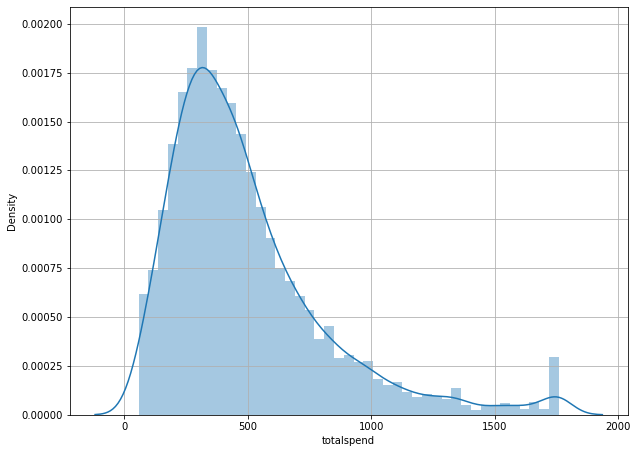

In [301]:
# Very first assumtion is that all the variables should be normally distributed, however that can't be possible
# However we have to be atleast strict about the dependant Y variable

# Distribution of variables
sns.distplot(custdata_final.totalspend)
plt.show()
# this distribution is highly skewed

# Notes:
#-----------------------------------------------------
# 1. if we get skewed data, then we have to transform the data and there are multiple methods to go about it
# 2. most commonly used and which works on most of the data is log transformation
# 3. Ideally we can do this for each of the dependant variable as well, 
#    however it will depend on amount of data and the amount of analytical rigour
# 4. In no case we can proceed if dependant variable is not normal/near to normal distributed

C:\Users\vishalk\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


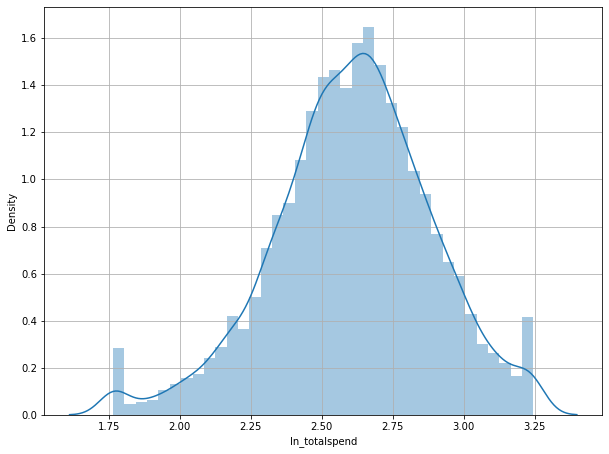

In [302]:
# Note: good practice is to take the log of the data plus 1, bcoz we don't have log of zero defined
# In this data its not required as totalspend are always greater than zero

# apply log transformation: log is rescaling the data and making the distribution normal
custdata_final['ln_totalspend'] = np.log10(custdata_final['totalspend'])

# Distribution of variables
sns.distplot(custdata_final.ln_totalspend)
plt.show()

In [303]:
# #Evaluating Best way of applying Transformation
# custdata_final['Sqr_totalspend'] = np.square(custdata_final.totalspend)
# custdata_final.Sqr_totalspend.hist()

In [304]:
# sns.distplot(custdata_final.Sqr_totalspend)

In [305]:
# #Evaluating Best way of applying Transformation
# data_final['Sqrt_Sales_in_thousands'] = np.sqrt(data_final.Sales_in_thousands)
# data_final.Sqrt_Sales_in_thousands.hist()

In [306]:
# sns.distplot(data_final.Sqrt_Sales_in_thousands)

In [307]:
# #Evaluating Best way of applying Transformation
# data_final['by1_Sales_in_thousands'] = 1/(data_final.Sales_in_thousands)
# data_final.by1_Sales_in_thousands.hist()

In [308]:
#sns.distplot(data_final.by1_Sales_in_thousands)

In [309]:
#So, on comparing to Y normal distribution, log transformation looks better here.

# Looking at the assumptions - Linearity relationship between Y & Xs

In [310]:
# Linearity: correlation matrix (ranges from 1 to -1)
corr_mat = custdata_final.corr()
corr_mat.to_csv('corr_mat.csv')
corr_mat

#Here totalspend is not the Y variable, rather ln_totalspend as we have done Transformation

,age,ed,income,lninc,debtinc,creddebt,lncreddebt,othdebt,lnothdebt,spoused,reside,pets,pets_cats,pets_dogs,pets_birds,pets_reptiles,pets_small,pets_saltfish,pets_freshfish,carvalue,commutetime,tenure,longmon,lnlongmon,longten,lnlongten,tollmon,lntollmon,tollten,lntollten,equipmon,lnequipmon,equipten,lnequipten,cardmon,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten,hourstv,totalspend,region_2,region_3,region_4,region_5,townsize_2.0,townsize_3.0,townsize_4.0,townsize_5.0,gender_1,agecat_3,agecat_4,agecat_5,agecat_6,edcat_2,edcat_3,edcat_4,edcat_5,jobcat_2,jobcat_3,jobcat_4,jobcat_5,jobcat_6,union_1,employ_1,employ_2,employ_3,employ_4,employ_5,employ_6,employ_7,employ_8,employ_9,employ_10,employ_11,employ_12,employ_13,employ_14,employ_15,employ_16,employ_17,employ_18,employ_19,employ_20,employ_21,employ_22,employ_23,employ_24,employ_25,employ_26,employ_27,employ_28,employ_29,employ_30,employ_31,employ_32,employ_33,employ_34,employ_35,employ_36,employ_37,employ_38,employ_39,employ_40,employ_41,employ_42,employ_43,employ_44,employ_45,employ_46,employ_47,employ_48,employ_49,employ_51,employ_52,empcat_2,empcat_3,empcat_4,empcat_5,retire_1,inccat_2,inccat_3,inccat_4,inccat_5,default_1,jobsat_2,jobsat_3,jobsat_4,jobsat_5,marital_1,spousedcat_1,spousedcat_2,spousedcat_3,spousedcat_4,spousedcat_5,homeown_1,hometype_2,hometype_3,hometype_4,address_1,address_2,address_3,address_4,address_5,address_6,address_7,address_8,address_9,address_10,address_11,address_12,address_13,address_14,address_15,address_16,address_17,address_18,address_19,address_20,address_21,address_22,address_23,address_24,address_25,address_26,address_27,address_28,address_29,address_30,address_31,address_32,address_33,address_34,address_35,address_36,address_37,address_38,address_39,address_40,address_41,address_42,address_43,address_44,address_45,address_46,address_47,address_48,address_49,address_50,address_51,address_52,address_53,address_54,address_55,address_57,addresscat_2,addresscat_3,addresscat_4,addresscat_5,cars_1,cars_2,cars_3,cars_4,cars_5,cars_6,cars_7,cars_8,carown_0,carown_1,cartype_0,cartype_1,carcatvalue_1,carcatvalue_2,carcatvalue_3,carbought_0,carbought_1,carbuy_1,commute_2,commute_3,commute_4,commute_5,commute_6,commute_7,commute_8,commute_9,commute_10,commutecat_2,commutecat_3,commutecat_4,commutecat_5,commutecar_1,commutemotorcycle_1,commutecarpool_1,commutebus_1,commuterail_1,commutepublic_1,commutebike_1,commutewalk_1,commutenonmotor_1,telecommute_1,reason_2,reason_3,reason_4,reason_9,polview_2,polview_3,polview_4,polview_5,polview_6,polview_7,polparty_1,polcontrib_1,vote_1,card_2,card_3,card_4,card_5,cardtype_2,cardtype_3,cardtype_4,cardbenefit_2,cardbenefit_3,cardbenefit_4,cardfee_1,cardtenure_1,cardtenure_2,cardtenure_3,cardtenure_4,cardtenure_5,cardtenure_6,cardtenure_7,cardtenure_8,cardtenure_9,cardtenure_10,cardtenure_11,cardtenure_12,cardtenure_13,cardtenure_14,cardtenure_15,cardtenure_16,cardtenure_17,cardtenure_18,cardtenure_19,cardtenure_20,cardtenure_21,cardtenure_22,cardtenure_23,cardtenure_24,cardtenure_25,cardtenure_26,cardtenure_27,cardtenure_28,cardtenure_29,cardtenure_30,cardtenure_31,cardtenure_32,cardtenure_33,cardtenure_34,cardtenure_35,cardtenure_36,cardtenure_37,cardtenure_38,cardtenure_39,cardtenure_40,cardtenurecat_2,cardtenurecat_3,cardtenurecat_4,cardtenurecat_5,card2_2,card2_3,card2_4,card2_5,card2type_2,card2type_3,card2type_4,card2benefit_2,card2benefit_3,card2benefit_4,card2fee_1,card2tenure_1,card2tenure_2,card2tenure_3,card2tenure_4,card2tenure_5,card2tenure_6,card2tenure_7,card2tenure_8,card2tenure_9,card2tenure_10,card2tenure_11,card2tenure_12,card2tenure_13,card2tenure_14,card2tenure_15,card2tenure_16,card2tenure_17,card2tenure_18,card2tenure_19,card2tenure_20,card2tenure_21,card2tenure_22,card2tenure_23,card2tenure_24,card2tenure_25,card2tenure_26,card2tenure_27,card2tenure_28,card2tenure_29,card2tenure_30,card2tenurecat_2,card2tenurecat_3,card2tenurecat_4,card2tenurecat_5,active_1,bfast_2,bfas

<AxesSubplot:>

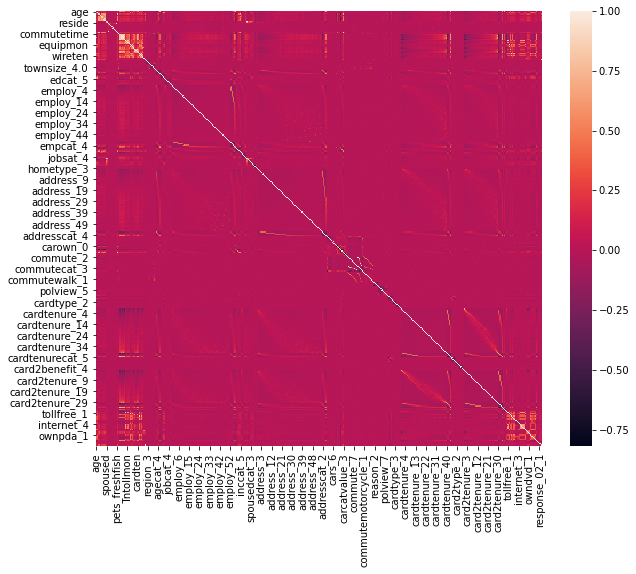

In [311]:
# visualize correlation matrix in Seaborn using a heatmap
plt.figure(figsize = (10, 8))
sns.heatmap(custdata_final.corr())

# in case we can't make any concrete decision looking at the variables; we can also check on the VAR of 
# the variables into consideration e.g Curb weight vs Wheel base

So we can see above most data points are near to line which means our data is normal and we can go ahed for further process.

In [312]:
custdata_final.columns

Index(['age', 'ed', 'income', 'lninc', 'debtinc', 'creddebt', 'lncreddebt',
       'othdebt', 'lnothdebt', 'spoused',
       ...
       'ownpda_1', 'ownpc_1', 'ownipod_1', 'owngame_1', 'ownfax_1', 'news_1',
       'response_01_1', 'response_02_1', 'response_03_1', 'ln_totalspend'],
      dtype='object', length=390)

In [313]:
#Feature Selection
custdata_final.info()
##Will start eliminating the features that are big in numbers as of now (Total 382).

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Columns: 390 entries, age to ln_totalspend
dtypes: float64(31), int64(14), uint8(345)
memory usage: 3.4 MB


In [314]:
#Dropping the y variable(totalspend) from dataframe because we are looking correlation between all x variables

custdata_final.drop(['totalspend'],axis=1,inplace=True)

In [315]:
#Features means X variables, Target means Y - variable.
features = custdata_final[custdata_final.columns.difference(['ln_totalspend','totalspend'])]#Difference of this will give features
target = custdata_final['ln_totalspend']

features.columns

Index(['active_1', 'address_1', 'address_10', 'address_11', 'address_12',
       'address_13', 'address_14', 'address_15', 'address_16', 'address_17',
       ...
       'townsize_2.0', 'townsize_3.0', 'townsize_4.0', 'townsize_5.0',
       'union_1', 'voice_1', 'vote_1', 'wireless_1', 'wiremon', 'wireten'],
      dtype='object', length=388)

In [316]:
#train and Test split 
train_X,test_X,train_y,test_y = train_test_split(custdata_final[features.columns],target,test_size=0.3,random_state=1234)

print (train_X.shape)
print (test_X.shape)
print (train_y.shape)
print (test_y.shape)

(3500, 388)
(1500, 388)
(3500,)
(1500,)


# Feature Selection

In [317]:
#Now, will build the model & recursively eliminate the features.

lm = LinearRegression()

#RFE

#Create the RFE model & select 15 attributes.
rfe = RFE(lm, n_features_to_select=15)
rfe = rfe.fit(features,target)
rfe

RFE(estimator=LinearRegression(), n_features_to_select=15)

In [318]:
rfe.support_
#So, rfe.support_ gives the 15 features to select. But such kind of feature selection sometimes not correct if we have 
#Multi-collinearity. 

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True,  True,  True,  True, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False,

In [319]:
#Alternative of capturing the important variables
RFE_features=features.columns[rfe.get_support()]
features1 = features[RFE_features]

# F - Regression

In [320]:
F_values, p_values  = f_regression(features1, target )

In [321]:
f_reg_results = [(i, v, z) for i, v, z in itertools.zip_longest(features1.columns, F_values,  ['%.3f' % p for p in p_values])]
f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])

In [322]:
f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])
f_reg_results = f_reg_results.sort_values(by=['P_Value']).head(15)

In [323]:
f_reg_results

,Variable,F_Value,P_Value
9,cardtenurecat_3,4.928417,0.026
3,card2tenure_8,3.085635,0.079
2,card2tenure_7,2.831782,0.092
13,employ_4,2.283647,0.131
10,empcat_2,1.994955,0.158
11,employ_2,1.787638,0.181
0,card2tenure_10,1.308762,0.253
12,employ_3,1.065897,0.302
7,cardtenure_8,0.595529,0.440
14,employ_5,0.566611,0.452


In [324]:
#Feature Selection using XGboost.
xg =xgboost.XGBRegressor(random_state=1234)
xg = xg.fit(train_X,train_y)
#Checking accuracy for train and test data
print("Train and Test Accuracy :")
print(xg.score(train_X,train_y))
print(xg.score(test_X,test_y))

Train and Test Accuracy :
0.9602977093055717
0.1509173403820523


In [325]:

#Identifying Key variables and Printing top 20 variables.
feature_importances_XG = pd.DataFrame(xg.feature_importances_,
                                   index =train_X.columns,
                                    columns=['importance']).sort_values('importance',ascending=False)
XG = pd.DataFrame(feature_importances_XG)
XG.to_excel('XG_Features.xlsx')
XG =XG.head(15)
lis_xg= XG.index
lis_xg



Index(['income', 'card_2', 'card_5', 'reason_2', 'employ_37', 'reason_3',
       'card_3', 'cardtenure_9', 'card2tenure_18', 'card_4', 'cardtenure_27',
       'cardtenurecat_5', 'cardtenure_24', 'employ_31', 'card2_5'],
      dtype='object')

In [326]:
#Feature Selection using Random Forest.
rf = ensemble.RandomForestRegressor(random_state=1234,max_depth=3)
rf = rf.fit(train_X,train_y)
#Checking accuracy for train and test data
print(rf.score(train_X,train_y))
print(rf.score(test_X,test_y))


0.20878594627710179
0.1485393109711497


In [327]:
#Identifying Key variables and Printing top 15 variables.
feature_importances_RF = pd.DataFrame(rf.feature_importances_,
                                   index =train_X.columns,
                                    columns=['importance']).sort_values('importance',ascending=False)
RF = pd.DataFrame(feature_importances_RF)
RF.to_excel("RF_Features.xlsx")
RF = RF.head(15)
lis_rf= RF.index
lis_rf

Index(['lninc', 'income', 'reason_2', 'card_4', 'age', 'card_3', 'carvalue',
       'gender_1', 'address_39', 'lnequipmon', 'cardtenure_24',
       'cardtenurecat_5', 'addresscat_5', 'card2_2', 'cardtenure_27'],
      dtype='object')

In [328]:
#Considering XGBoost Feature Technique
train_X = train_X[lis_xg]
test_X =test_X[lis_xg]


# Model Building :

### Linear Regression :

In [329]:
#Linear Regression :
lr = linear_model.LinearRegression()
lr = lr.fit(train_X,train_y)

In [330]:
#Checking Accuracy for train and Test data
print(lr.score(train_X,train_y))
print(lr.score(test_X,test_y))

0.2648575705531099
0.21921383889692325


In [331]:
#Checking Mean Square Error  for Train and Test Data
print("Mean Square Error :\n")
print(metrics.mean_squared_error(train_y,lr.predict(train_X)))
print(metrics.mean_squared_error(test_y, lr.predict(test_X)))

#Checking Root Mean Square Error
print("\nRoot Mean Square Error :\n")
print(np.sqrt(metrics.mean_squared_error(train_y,lr.predict(train_X))))
print(np.sqrt(metrics.mean_squared_error(test_y,lr.predict(test_X))))

Mean Square Error :

0.05856491498587223
0.059019970321581176

Root Mean Square Error :

0.24200189045929418
0.24294026080825132


<Figure size 288x288 with 0 Axes>

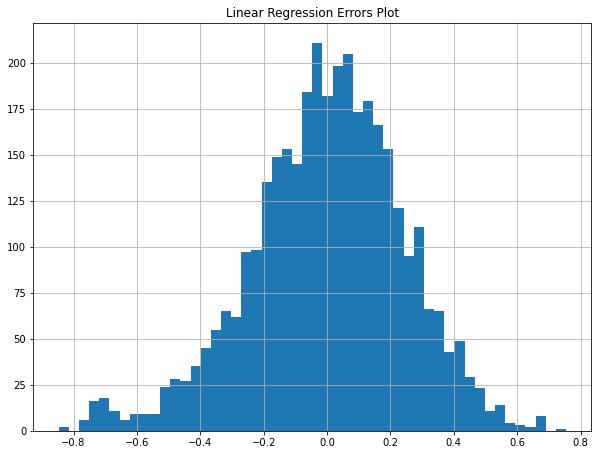

<Figure size 288x288 with 0 Axes>

In [332]:
#Checking Error Distribution :
(train_y-lr.predict(train_X)).hist(bins=50)
plt.title("Linear Regression Errors Plot")
plt.figure(figsize=(4,4))

# Lasso Regression :

In [333]:
#Lasso Regression :
ls = linear_model.Lasso()
ls = ls.fit(train_X,train_y)

In [334]:
#Checking Accuracy for train and Test data
print(ls.score(train_X,train_y))
print(ls.score(test_X,test_y))

0.13585840863538234
0.09254930576621567


In [335]:
#Checking Mean Square Error  for Train and Test Data
print("Mean Square Error :\n")
print(metrics.mean_squared_error(train_y,ls.predict(train_X)))
print(metrics.mean_squared_error(test_y, ls.predict(test_X)))

#Checking Root Mean Square Error
print("\nRoot Mean Square Error :\n")
print(np.sqrt(metrics.mean_squared_error(train_y,ls.predict(train_X))))
print(np.sqrt(metrics.mean_squared_error(test_y,ls.predict(test_X))))

Mean Square Error :

0.06884159695707148
0.06859459825249858

Root Mean Square Error :

0.26237682244640337
0.26190570488727155


<Figure size 288x288 with 0 Axes>

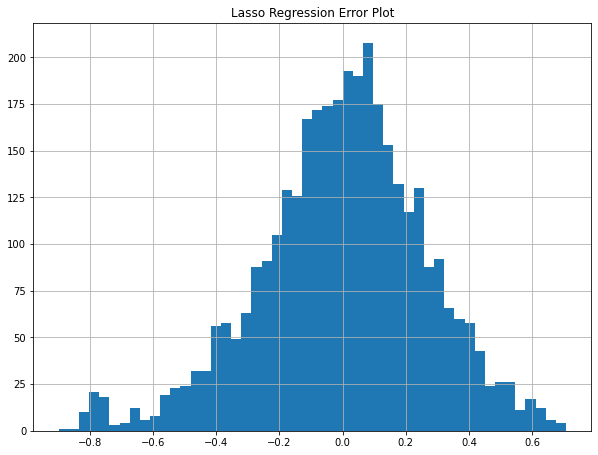

<Figure size 288x288 with 0 Axes>

In [336]:
#Checking Error Distribution :
(train_y-ls.predict(train_X)).hist(bins=50)
plt.title("Lasso Regression Error Plot")
plt.figure(figsize=(4,4))

# Ridge Regression :

In [337]:
#Ridge Regression :
rg = linear_model.Ridge()
rg = rg.fit(train_X,train_y)

In [338]:
#Checking Accuracy for train and Test data
print(rg.score(train_X,train_y))
print(rg.score(test_X,test_y))

0.2648437467122461
0.21954361809193568


In [339]:
#Checking Mean Square Error  for Train and Test Data
print("Mean Square Error :\n")
print(metrics.mean_squared_error(train_y,rg.predict(train_X)))
print(metrics.mean_squared_error(test_y, rg.predict(test_X)))

#Checking Root Mean Square Error
print("\nRoot Mean Square Error :\n")
print(np.sqrt(metrics.mean_squared_error(train_y,rg.predict(train_X))))
print(np.sqrt(metrics.mean_squared_error(test_y,rg.predict(test_X))))

Mean Square Error :

0.05856601625826861
0.058995042166764995

Root Mean Square Error :

0.2420041657870141
0.24288895027721


<Figure size 288x288 with 0 Axes>

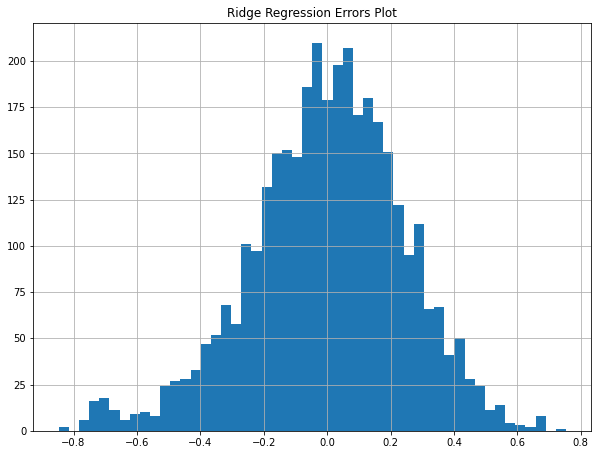

<Figure size 288x288 with 0 Axes>

In [340]:
#Checking Error Distribution :
(train_y-rg.predict(train_X)).hist(bins=50)
plt.title("Ridge Regression Errors Plot")
plt.figure(figsize=(4,4))

# Decision Trees :

In [341]:
#decision tree with tuning parameters.
param_dt = {'max_depth': [5,6,7,8,10],'max_features':[8,12,15]}
dt = GridSearchCV(estimator=tree.DecisionTreeRegressor(random_state=1234), param_grid=param_dt, cv=2,verbose=True, n_jobs=-1)
dt = dt.fit(train_X,train_y)

Fitting 2 folds for each of 15 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    2.8s finished


In [342]:
#Checking Accuracy for train and Test data
print(dt.score(train_X,train_y))
print(dt.score(test_X,test_y))

0.24224272959848714
0.16680333744889908


In [343]:
#Predicting values for train and test data sets.
pred_dt_train = dt.predict(train_X)
pred_dt_test = dt.predict(test_X)

In [344]:
#Checking Mean Square Error  for Train and Test Data
print("Mean Square Error :\n")
print(metrics.mean_squared_error(train_y,pred_dt_train))
print(metrics.mean_squared_error(test_y, pred_dt_test))

#Checking Root Mean Square Error
print("\nRoot Mean Square Error :\n")
print(np.sqrt(metrics.mean_squared_error(train_y,pred_dt_train)))
print(np.sqrt(metrics.mean_squared_error(test_y,pred_dt_test)))

Mean Square Error :

0.06036651993326043
0.06298170324424399

Root Mean Square Error :

0.24569599087746716
0.25096155730359176


<Figure size 288x288 with 0 Axes>

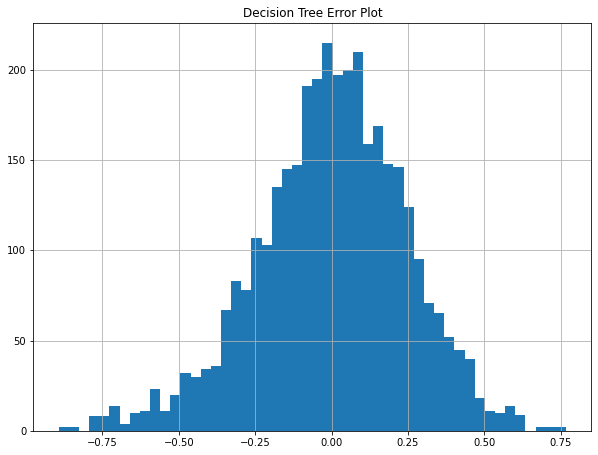

<Figure size 288x288 with 0 Axes>

In [345]:
#Checking Error Distribution :
(train_y-pred_dt_train).hist(bins=50)
plt.title("Decision Tree Error Plot")
plt.figure(figsize=(4,4))

In [346]:
#Saving model
pickle.dump(dt,open('dt_model','wb'))

# Bagging :

In [347]:
#Bagging model with different tuning parameters
param_bg = {'n_estimators': [80,100,120,150,200]}
bg = GridSearchCV(estimator=ensemble.BaggingRegressor(random_state=1234), param_grid=param_bg, cv=2,verbose=True, n_jobs=-1)
bg = bg.fit(train_X,train_y)

Fitting 2 folds for each of 5 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    0.9s remaining:    0.6s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    1.7s finished


In [348]:
#Checking Accuracy for train and Test data
print(bg.score(train_X,train_y))
print(bg.score(test_X,test_y))

0.5659528612623823
0.09090257612045194


In [349]:
#Predicting values for train and test data
pred_bg_train = bg.predict(train_X)
pred_bg_test = bg.predict(test_X)

In [350]:
#Checking Mean Square Error  for Train and Test Data
print("Mean Square Error :\n")
print(metrics.mean_squared_error(train_y,pred_bg_train))
print(metrics.mean_squared_error(test_y, pred_bg_test))

#Checking Root Mean Square Error
print("\nRoot Mean Square Error :\n")
print(np.sqrt(metrics.mean_squared_error(train_y,pred_bg_train)))
print(np.sqrt(metrics.mean_squared_error(test_y,pred_bg_test)))

Mean Square Error :

0.03457824329246679
0.06871907527279225

Root Mean Square Error :

0.18595226078880242
0.2621432342685812


<Figure size 288x288 with 0 Axes>

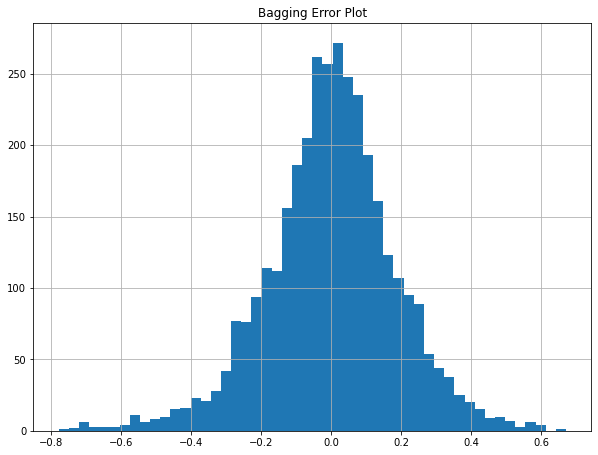

<Figure size 288x288 with 0 Axes>

In [351]:
#Checking Error Distribution :
(train_y-pred_bg_train).hist(bins=50)
plt.title("Bagging Error Plot")
plt.figure(figsize=(4,4))

In [352]:
#Saving model

pickle.dump(bg,open('bg_model','wb'))

# Random Forest :

In [353]:
#Building Random Forest model with different Tuning parameters
param_rf = {'n_estimators': [100,150,200],'max_depth':[5,6,7]}
rf = GridSearchCV(estimator=ensemble.RandomForestRegressor(), param_grid=param_rf, cv=2,verbose=True, n_jobs=-1)
rf= rf.fit(train_X,train_y)

Fitting 2 folds for each of 9 candidates, totalling 18 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 out of  18 | elapsed:    1.5s finished


In [354]:
#Checking Accuracy for train and Test data
print(rf.score(train_X,train_y))
print(rf.score(test_X,test_y))

0.3254493436491116
0.23825561161018827


In [355]:
#Predicting values for train and test 
pred_rf_train = rf.predict(train_X)
pred_rf_test = rf.predict(test_X)

In [356]:
#Checking Mean Square Error  for Train and Test Data
print("Mean Square Error :\n")
print(metrics.mean_squared_error(train_y,pred_rf_train))
print(metrics.mean_squared_error(test_y,pred_rf_test))

#Checking Root Mean Square Error
print("\nRoot Mean Square Error :\n")
print(np.sqrt(metrics.mean_squared_error(train_y,pred_rf_train)))
print(np.sqrt(metrics.mean_squared_error(test_y,pred_rf_test)))

Mean Square Error :

0.053737888415142966
0.05758059432288333

Root Mean Square Error :

0.23181434040012056
0.2399595681003017


<Figure size 288x288 with 0 Axes>

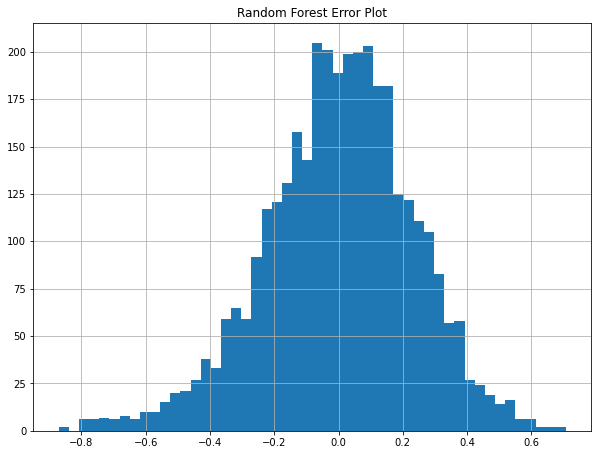

<Figure size 288x288 with 0 Axes>

In [357]:
#Checking Error Distribution :
(train_y-pred_rf_train).hist(bins=50)
plt.title("Random Forest Error Plot")
plt.figure(figsize=(4,4))

In [358]:
#Saving model

pickle.dump(rf,open('rf_model','wb'))

# AdaBoost :

In [359]:
#Building AdaBoost Model with different tuning parameters
param_ada = {'n_estimators': [100,120,150,200],'learning_rate': [0.01]}
ad = GridSearchCV(estimator=ensemble.AdaBoostRegressor(), param_grid=param_ada, cv=2,verbose=True, n_jobs=-1)
ad = ad.fit(train_X,train_y)

Fitting 2 folds for each of 4 candidates, totalling 8 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    0.4s remaining:    1.5s
[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    0.8s finished


In [360]:
#Checking Accuracy for train and Test data
print(ad.score(train_X,train_y))
print(ad.score(test_X,test_y))

0.20788564204808857
0.15417205383803823


In [361]:
#Predicting values for train and test data
pred_ad_train = ad.predict(train_X)
pred_ad_test = ad.predict(test_X)

In [362]:
#Checking Mean Square Error  for Train and Test Data
print("Mean Square Error :\n")
print(metrics.mean_squared_error(train_y,pred_ad_train))
print(metrics.mean_squared_error(test_y,pred_ad_test))

#Checking Root Mean Square Error
print("\nRoot Mean Square Error :\n")
print(np.sqrt(metrics.mean_squared_error(train_y,pred_ad_train)))
print(np.sqrt(metrics.mean_squared_error(test_y,pred_ad_test)))

Mean Square Error :

0.06310356765483617
0.06393650754403238

Root Mean Square Error :

0.2512042349460617
0.2528566936903834


<Figure size 288x288 with 0 Axes>

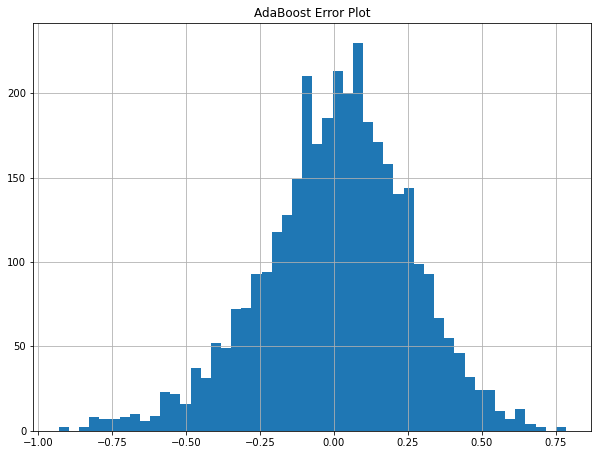

<Figure size 288x288 with 0 Axes>

In [363]:
#Checking Error Distribution :
(train_y-pred_ad_train).hist(bins=50)
plt.title("AdaBoost Error Plot")
plt.figure(figsize=(4,4))

In [364]:
#Saving model

pickle.dump(ad,open('ad_model','wb'))

# Gradient Boost :

In [365]:
#Building Model with different tuning parameters.
param_gb = {'n_estimators': [100,150,200],'max_depth':[5,6],'learning_rate': [0.01]}
gb = GridSearchCV(estimator =ensemble.GradientBoostingRegressor(), param_grid=param_gb, cv=2,verbose=True, n_jobs=-1)
gb = gb.fit(train_X,train_y)

Fitting 2 folds for each of 6 candidates, totalling 12 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  12 | elapsed:    0.6s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed:    0.7s finished


In [366]:
#Checking Accuracy for train and Test data
print(gb.score(train_X,train_y))
print(gb.score(test_X,test_y))

0.31358498329071816
0.23695656545084043


In [367]:
#Predicting values for train and test 
pred_gb_train = gb.predict(train_X)
pred_gb_test = gb.predict(test_X)

In [368]:
#Checking Mean Square Error  for Train and Test Data
print("Mean Square Error :\n")
print(metrics.mean_squared_error(train_y,pred_gb_train))
print(metrics.mean_squared_error(test_y, pred_gb_test))

#Checking Root Mean Square Error
print("\nRoot Mean Square Error :\n")
print(np.sqrt(metrics.mean_squared_error(train_y,pred_gb_train)))
print(np.sqrt(metrics.mean_squared_error(test_y,pred_gb_test)))

Mean Square Error :

0.054683059347902005
0.057678789795076076

Root Mean Square Error :

0.23384409196706682
0.24016408931202865


<Figure size 288x288 with 0 Axes>

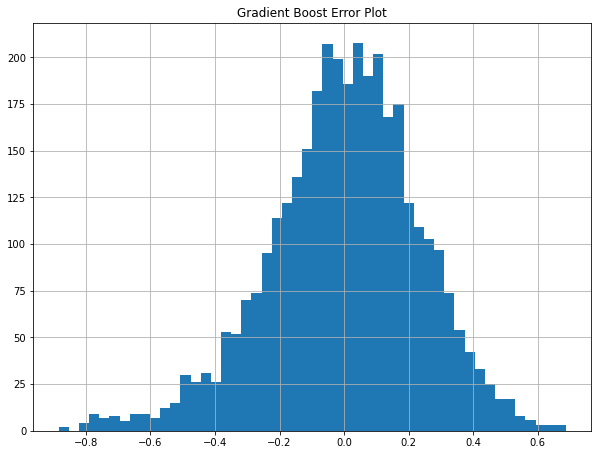

<Figure size 288x288 with 0 Axes>

In [369]:
#Checking Error Distribution :
(train_y-pred_gb_train).hist(bins=50)
plt.title("Gradient Boost Error Plot")
plt.figure(figsize=(4,4))

In [370]:
#Saving model

pickle.dump(gb,open('gb_model','wb'))

# XGBoost :

In [371]:
#Building Model with different tuning parameters.
param_xg = {'n_estimators': [250,300,400],'max_depth':[8,10]}
xg = GridSearchCV(estimator=xgboost.XGBRegressor(), param_grid=param_xg, cv=2,verbose=True, n_jobs=-1)
xg = xg.fit(train_X,train_y)

Fitting 2 folds for each of 6 candidates, totalling 12 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  12 | elapsed:    3.4s remaining:    0.6s
[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed:    3.5s finished


In [372]:
#Checking Accuracy for train and Test data
print(xg.score(train_X,train_y))
print(xg.score(test_X,test_y))

0.6007458491745027
-0.017867865076604872


In [373]:
#Predicting values for train and test
pred_xg_train = xg.predict(train_X)
pred_xg_test = xg.predict(test_X)

In [374]:
#Checking Mean Square Error  for Train and Test Data
print("Mean Square Error :\n")
print(metrics.mean_squared_error(train_y,pred_xg_train))
print(metrics.mean_squared_error(test_y,pred_xg_test))

#Checking Root Mean Square Error
print("\nRoot Mean Square Error :\n")
print(np.sqrt(metrics.mean_squared_error(train_y,pred_xg_train)))
print(np.sqrt(metrics.mean_squared_error(test_y,pred_xg_test)))

Mean Square Error :

0.031806469691110506
0.07694108090138342

Root Mean Square Error :

0.17834368419181687
0.277382553347148


<Figure size 288x288 with 0 Axes>

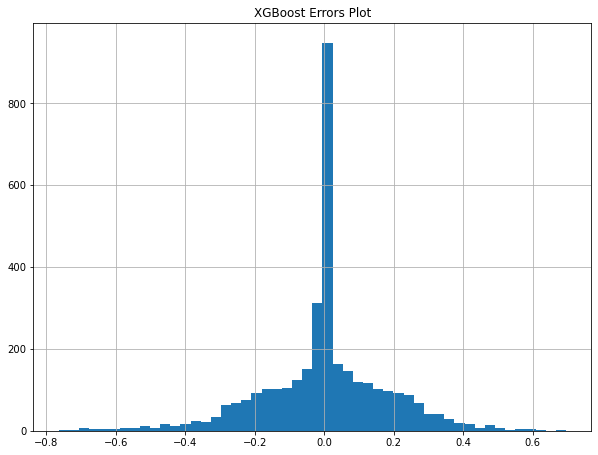

<Figure size 288x288 with 0 Axes>

In [375]:
#Checking Error Distribution :
(train_y-pred_xg_train).hist(bins=50)
plt.title("XGBoost Errors Plot")
plt.figure(figsize=(4,4))

In [376]:
#Saving model

pickle.dump(xg,open('xg_model','wb'))

# KNN :

In [377]:
param_knn = [{'n_neighbors': [20,25,30],'leaf_size':[50,100,150]}]
kn = GridSearchCV(estimator=neighbors.KNeighborsRegressor(), param_grid=param_knn, cv=2,verbose=True, n_jobs=-1)
kn = kn.fit(train_X,train_y)

Fitting 2 folds for each of 9 candidates, totalling 18 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 out of  18 | elapsed:    0.0s finished


In [378]:
#Checking Accuracy for train and Test data
print(kn.score(train_X,train_y))
print(kn.score(test_X,test_y))

0.23309220106318163
0.148079019268899


In [379]:
#Predicting values for train and test
pred_kn_train = kn.predict(train_X)
pred_kn_test = kn.predict(test_X)

In [380]:
#Checking Mean Square Error  for Train and Test Data
print("Mean Square Error :\n")
print(metrics.mean_squared_error(train_y,pred_kn_train))
print(metrics.mean_squared_error(test_y, pred_kn_test))

#Checking Root Mean Square Error
print("\nRoot Mean Square Error :\n")
print(np.sqrt(metrics.mean_squared_error(train_y,pred_kn_train)))
print(np.sqrt(metrics.mean_squared_error(test_y,pred_kn_test)))

Mean Square Error :

0.0610954942167189
0.06439708271474354

Root Mean Square Error :

0.24717502749411985
0.25376580288672373


<Figure size 288x288 with 0 Axes>

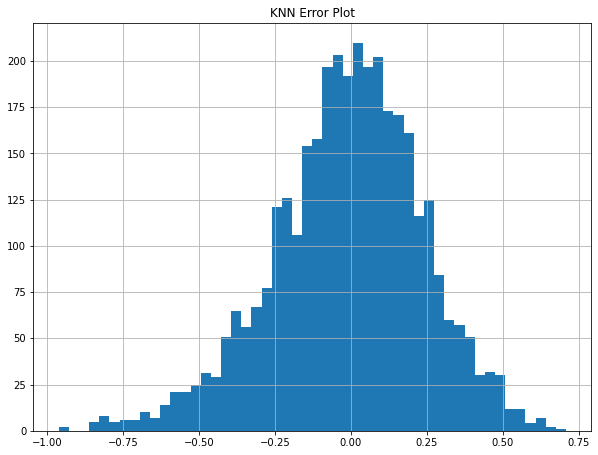

<Figure size 288x288 with 0 Axes>

In [381]:
#Checking Error Distribution :
(train_y-pred_kn_train).hist(bins=50)
plt.title("KNN Error Plot")
plt.figure(figsize=(4,4))

In [382]:
#Saving model

pickle.dump(kn,open('kn_model','wb'))